## Intel Image Classification
#### Image Scene Classification of Multiclass using different pretrained models.


##### Dataset details: https://www.kaggle.com/datasets/puneet6060/intel-image-classification/data
##### Approximately 25,000 images
##### Images are grouped into categories such as buildings, forests, glaciers, mountains, seas, and streets. 
##### Dataset is divided into folders for training, testing, and prediction:
##### 14,000 training images
##### 3,000 validation images
##### 7,000 test images

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test and 7k in Prediction.
This data was initially published on https://datahack.analyticsvidhya.com by Intel to host a Image classification Challenge.

Acknowledgements
Thanks to https://datahack.analyticsvidhya.com for the challenge and Intel for the Data

Photo by Jan Böttinger on Unsplash

### We would use Resnet50, Alexnet, VGG16 Pre-trained models and finetune these models to predict 6 classes of our dataset 
ie. {'buildings' -> 0, 'forest' -> 1, 'glacier' -> 2, 'mountain' -> 3, 'sea' -> 4, 'street' -> 5 }

In [107]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset 
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
style.use('dark_background')
import pandas as pd

import torchvision.transforms as transforms 
from torchvision.datasets import ImageFolder
import torch.optim as optim
from PIL import Image
import torchvision
from torch.autograd import Variable

In [2]:
torch.cuda.is_available()

True

In [3]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [93]:
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
class_names_labels = {class_name:i for i, class_name in enumerate(class_names)}
nb_classes = len(class_names)
IMAGE_SIZE = (150,150)

class_names_labels.values()

dict_values([0, 1, 2, 3, 4, 5])

In [94]:
dataset = ImageFolder('./archive/seg_train/seg_train')
test = ImageFolder('./archive/seg_test/seg_test')
train_data, train_label = dataset.imgs, dataset.targets
test_data, test_label = test.imgs, test.targets

In [95]:
from collections import Counter
print(dict(Counter(dataset.targets)))

{0: 2191, 1: 2271, 2: 2404, 3: 2512, 4: 2274, 5: 2382}


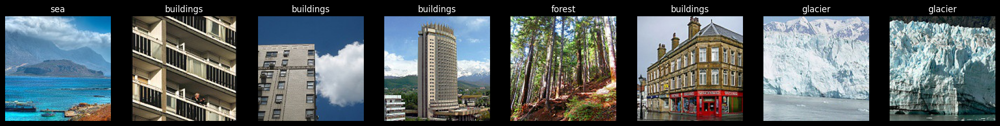

In [99]:
import matplotlib.pyplot as plt
from torchvision import transforms
import random

# Function to display random sample images
def display_random_sample_images(data, labels, class_names, num_samples=5):
    random_indices = random.sample(range(len(data)), num_samples)

    fig, axes = plt.subplots(1, num_samples, figsize=(25, 5))

    for i, idx in enumerate(random_indices):
        img_path, label = data[idx], labels[idx]
        img = Image.open(img_path)
        
        transform = transforms.Compose([transforms.Resize(IMAGE_SIZE),
                                        transforms.ToTensor()])
        img = transform(img)

        axes[i].imshow(img.permute(1, 2, 0)) 
        axes[i].set_title(class_names[label])
        axes[i].axis('off')

    plt.show()

# Display random sample images from the training dataset
display_random_sample_images([item[0] for item in train_data], train_label, class_names, num_samples=8)



In [101]:
from torchvision import transforms
from sklearn.model_selection import train_test_split

# Preprocessing transformations
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to the input size
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize 
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to the input size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Apply transformations to the entire dataset
processed_data = [(transform_train(Image.open(img_path)), label) for img_path, label in train_data]
test_data = [(transform_test(Image.open(img_path)), label) for img_path, label in test_data]

# Split the dataset into training and validation sets
train_data, val_data, train_label, val_label = train_test_split(
    processed_data, train_label, test_size=0.2, random_state=42
)


### Split the dataset into training and validation sets for better analysis and fine tune into 80% and 20% respepctively. 'seg_test' is the folder used for tesing, 'seg_pred' is used for final predection which dose not have true_lables so we would visualize those images with the model created.

In [102]:
train_loader = DataLoader(train_data, batch_size = 32, shuffle=True, drop_last=True)
val_loader = DataLoader(val_data, batch_size= 32, drop_last=True)
test_loader = DataLoader(test_data, batch_size=32, drop_last=True)

print(f'Training images available: {len(train_data)}')
print(f'Validation images available:  {len(val_data)}')
print(f'Test images available:  {len(test_data)}')

Training images available: 11227
Validation images available:  2807
Test images available:  3000


In [103]:
for images,labels in train_loader:
    break
images.shape

torch.Size([32, 3, 224, 224])

In [104]:
labels

tensor([4, 5, 0, 5, 0, 1, 0, 4, 0, 2, 1, 4, 0, 0, 1, 3, 4, 2, 5, 0, 0, 2, 0, 5,
        4, 3, 1, 3, 5, 1, 3, 3])

Label: [4 5 0 5 0 1 0 4 0 2 1 4 0 0 1 3 4 2 5 0 0 2 0 5 4 3 1 3 5 1 3 3]
Class: sea street buildings street buildings forest buildings sea buildings glacier forest sea buildings buildings forest mountain sea glacier street buildings buildings glacier buildings street sea mountain forest mountain street forest mountain mountain


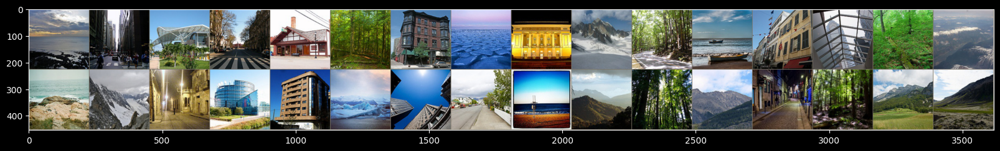

In [105]:
from torchvision.utils import make_grid
# Print the labels

print('Label:', labels.numpy())
print('Class:', *np.array([class_names[i] for i in labels]))

im = make_grid(images, nrow=16)  # 16 images in a row
# Inverse normalize the images

inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)
im_inv = inv_normalize(im)

# Print the images

plt.figure(figsize=(20,16))
plt.imshow(np.transpose((im_inv.numpy()*255).astype(np.uint8), (1, 2, 0))); # we see that dataloader has shuffle the images

## RESNET 50 MODEL

In [111]:
resnet = torchvision.models.resnet50(pretrained=True)

c:\Users\bhave\anaconda3\envs\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\bhave\anaconda3\envs\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to C:\Users\bhave/.cache\torch\hub\checkpoints\resnet50-0676ba61.pth
100.0%


In [112]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [113]:
# Freeze all layers
for p in resnet.parameters():
    p.requires_grad = False


In [114]:
 # Now we make later layers trainable
for param in resnet.layer4.parameters():
    param.requires_grad = True
for param in resnet.layer3.parameters():
    param.requires_grad = True
for param in resnet.avgpool.parameters():
    param.requires_grad = True

# Replace 1 FC with 3 new FC

resnet.fc = nn.Sequential(
                nn.Linear(in_features=2048, out_features=1024, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=1024, out_features=512, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=512, out_features=256, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=256, out_features=128, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=128, out_features=64, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=64, out_features=6, bias=True))


In [115]:
resnet

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [116]:
lossfunc = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam([
                                          {"params": resnet.layer3.parameters(), "lr": 0.0001},
                                          {"params": resnet.layer4.parameters(), "lr": 0.0001},
                                          {"params": resnet.avgpool.parameters(), "lr": 0.0001},
                                          {"params": resnet.fc[0].parameters(), "lr": 0.0001},
                                          {"params": resnet.fc[2].parameters(), "lr": 0.0001},
                                          {"params": resnet.fc[4].parameters(), "lr": 0.001},
                                          {"params": resnet.fc[6].parameters(), "lr": 0.001},
                                          {"params": resnet.fc[8].parameters(), "lr": 0.001},
                                          {"params": resnet.fc[10].parameters(), "lr": 0.001},
                                           ],
                                lr=0.001, betas=(0.9, 0.999), weight_decay = 0.004)

In [117]:
class EarlyStoppingCriterion():
    def __init__(self, patience = 3, delta = 0,  trace_func = print):

        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.trace_func = trace_func

    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score

        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

In [118]:
resnet.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [119]:
import time

# epochs
epochs = 51

# Instantiating the early stopping
earlystopping = EarlyStoppingCriterion()

In [121]:


# Initialize losses and Accuracies

losses    = torch.zeros(epochs)
trainAcc  = []
testAcc   = []

# loop over epochs
for epoch in range(epochs):
    start_time = time.time()
    resnet.train()

    # loop over training data batches
    batchAcc  = []
    batchLoss = []
    for X,y in train_loader:

        X = X.to(device) # Placing features on device
        y = y.to(device) # placing labels on device

        ypred = resnet(X)
        loss = lossfunc(ypred,y)


        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Append batchloss
        batchLoss.append(loss.item())

        ypred = ypred.cpu() # Back to cpu
        y = y.cpu()

        # Compute batch accuracy
        acc = 100 * torch.mean((torch.argmax(ypred, dim=1) == y).float())
        batchAcc.append(acc)

    # Batch loop concluded

    # Average training accuracy (Outside the batchloop)

    trainAcc.append(np.mean(batchAcc))

    # Losses through epochs

    losses[epoch] = np.mean(batchLoss)

    # TESTING the model

    resnet.eval()

    X,y = next(iter(val_loader))
    X = X.to(device)
    y = y.to(device)

    with torch.no_grad(): #This step  Deactivating autogradient
        ypred = resnet(X)
        ypred = ypred.cpu()
        y = y.cpu()

        # Appending test accuracy

        testAcc.append(100 * torch.mean((torch.argmax(ypred,dim=1)==y).float()))


    epoch_len = len(str(epochs))

    print_msg = (f'[{epoch+1:>{epoch_len}}/{epochs:>{epoch_len}}] ' +
             f'Train Loss: {np.mean(batchLoss):.5f}, Train Accuracy: {trainAcc[-1]:.2f}%, Overall Test Accuracy: {testAcc[-1]:.2f}%')

    print(print_msg)

    earlystopping(np.mean(batchLoss), resnet)

    # Optionally break the loop if early stopping criteria met
    if earlystopping.early_stop:
        print("Early stopping")
        break

    end_time = time.time()
    time_taken = end_time - start_time
    print(f'Time taken for Epoch {epoch+1}: {time_taken:.2f} seconds\n')

[ 1/51] Train Loss: 0.43590, Train Accuracy: 84.72%, Overall Test Accuracy: 90.62%
Time taken for Epoch 1: 104.52 seconds

[ 2/51] Train Loss: 0.28601, Train Accuracy: 90.67%, Overall Test Accuracy: 84.38%
Time taken for Epoch 2: 95.75 seconds

[ 3/51] Train Loss: 0.27048, Train Accuracy: 91.58%, Overall Test Accuracy: 90.62%
Time taken for Epoch 3: 96.13 seconds

[ 4/51] Train Loss: 0.23949, Train Accuracy: 92.60%, Overall Test Accuracy: 90.62%
Time taken for Epoch 4: 89.21 seconds

[ 5/51] Train Loss: 0.23327, Train Accuracy: 92.97%, Overall Test Accuracy: 93.75%
Time taken for Epoch 5: 83.59 seconds

[ 6/51] Train Loss: 0.20732, Train Accuracy: 93.11%, Overall Test Accuracy: 87.50%
Time taken for Epoch 6: 83.56 seconds

[ 7/51] Train Loss: 0.19603, Train Accuracy: 93.85%, Overall Test Accuracy: 96.88%
Time taken for Epoch 7: 83.56 seconds

[ 8/51] Train Loss: 0.18444, Train Accuracy: 94.40%, Overall Test Accuracy: 93.75%
Time taken for Epoch 8: 83.62 seconds

[ 9/51] Train Loss: 0.1

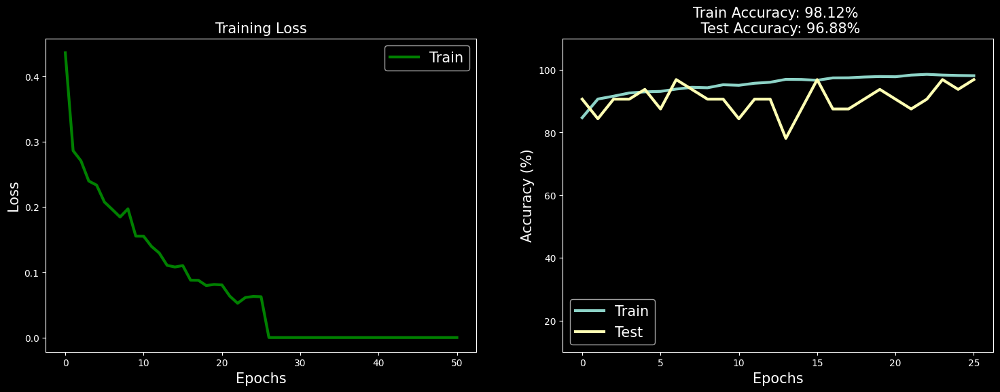

In [122]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(18, 6))

ax[0].plot(losses, 'g', lw=3, label='Train')
ax[0].set_xlabel('Epochs', fontsize=15)
ax[0].set_ylabel('Loss', fontsize=15)
ax[0].legend(fontsize=15)
ax[0].set_title('Training Loss', fontsize=15)

ax[1].plot(trainAcc, label='Train', lw=3)
ax[1].plot(testAcc, label='Test', lw=3)
ax[1].set_xlabel('Epochs', fontsize=15)
ax[1].set_ylabel('Accuracy (%)', fontsize=15)
ax[1].set_ylim([10, 110])
ax[1].set_title(f'Train Accuracy: {trainAcc[-1]:.2f}% \n Test Accuracy: {testAcc[-1]:.2f}%', fontsize=15)
ax[1].legend(fontsize=15)

plt.show()

#### Accuracy on Validation Dataset

In [125]:
#Testing Accuracy on 10000 testing images.

correct = 0
total = 0
with torch.no_grad():
    for data in val_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = resnet(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the val images: %.2f %%' % (100 * correct / total))

Accuracy of the network on the val images: 91.70 %


#### Predict and calculate the Accuracy of each class in the Validation Dataset

In [126]:
# Determine the number of classes dynamically
num_classes = len(class_names)

class_correct = list(0. for _ in range(num_classes))
class_total = list(0. for _ in range(num_classes))

# Rest of your code remains the same
with torch.no_grad():
    for data in val_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = resnet(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(len(labels)):
            label = labels[i].item()
            class_correct[label] += c[i].item()
            class_total[label] += 1

# Print accuracy for each class
for i in range(num_classes):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))


Accuracy of buildings : 90 %
Accuracy of forest : 98 %
Accuracy of glacier : 80 %
Accuracy of mountain : 92 %
Accuracy of   sea : 93 %
Accuracy of street : 94 %


#### Accuracy on Testing Dataset

In [127]:
#Testing Accuracy on 10000 testing images.

correct = 0
total = 0
with torch.no_grad():
    for data in test_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = resnet(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %.2f %%' % (100 * correct / total))

Accuracy of the network on the test images: 90.66 %


#### Predict and calculate the Accuracy of each class in the Validation Dataset

In [128]:
# Determine the number of classes dynamically
num_classes = len(class_names)

class_correct = list(0. for _ in range(num_classes))
class_total = list(0. for _ in range(num_classes))

# Rest of your code remains the same
with torch.no_grad():
    for data in test_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = resnet(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(len(labels)):
            label = labels[i].item()
            class_correct[label] += c[i].item()
            class_total[label] += 1

# Print accuracy for each class
for i in range(num_classes):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))


Accuracy of buildings : 84 %
Accuracy of forest : 99 %
Accuracy of glacier : 79 %
Accuracy of mountain : 91 %
Accuracy of   sea : 95 %
Accuracy of street : 94 %


In [129]:
# Save the trained ResNet model
torch.save(resnet.state_dict(), 'resnet_model.pth')

## ALEX NET MODEL

In [242]:
alexnet_model = torchvision.models.alexnet(pretrained=True)

c:\Users\bhave\anaconda3\envs\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\bhave\anaconda3\envs\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [243]:
alexnet_model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [244]:
# Freeze all layers
for param in alexnet_model.parameters():
    param.requires_grad = False


In [245]:
# Now make later layers trainable
for param in alexnet_model.classifier[1].parameters():
    param.requires_grad = True
for param in alexnet_model.classifier[4].parameters():
    param.requires_grad = True
for param in alexnet_model.classifier[6].parameters():
    param.requires_grad = True

# Replace the fully connected layers
alexnet_model.classifier = nn.Sequential(
    nn.Linear(in_features=9216, out_features=4096, bias=True),
    nn.ReLU(),
    nn.Linear(in_features=4096, out_features=1024, bias=True),
    nn.ReLU(),
    nn.Linear(in_features=1024, out_features=512, bias=True),
    nn.ReLU(),
    nn.Linear(in_features=512, out_features=256, bias=True),
    nn.ReLU(),
    nn.Linear(in_features=256, out_features=128, bias=True),
    nn.ReLU(),
    nn.Linear(in_features=128, out_features=64, bias=True),
    nn.ReLU(),
    nn.Linear(in_features=64, out_features=6, bias=True)
)

alexnet_model

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Linear(in_features=9216, out_features=4096, bias=True)
    (1): ReLU()
    (2): Linear(in_featu

In [246]:
alexnet_model.to(device)

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Linear(in_features=9216, out_features=4096, bias=True)
    (1): ReLU()
    (2): Linear(in_featu

In [247]:
lossfunc = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam([
                                          {"params": alexnet_model.avgpool.parameters(), "lr": 0.0001},
                                          {"params": alexnet_model.classifier[0].parameters(), "lr": 0.0001},
                                          {"params": alexnet_model.classifier[2].parameters(), "lr": 0.0001},
                                          {"params": alexnet_model.classifier[4].parameters(), "lr": 0.001},
                                          {"params": alexnet_model.classifier[6].parameters(), "lr": 0.001},
                                          {"params": alexnet_model.classifier[8].parameters(), "lr": 0.001},
                                           ],
                                lr=0.001, betas=(0.9, 0.999), weight_decay = 0.004)

In [248]:
import time

# epochs
epochs = 51

# Instantiating the early stopping
earlystopping = EarlyStoppingCriterion()

In [249]:
# Initialize losses and Accuracies

losses    = torch.zeros(epochs)
trainAcc  = []
testAcc   = []

# loop over epochs
for epoch in range(epochs):
    start_time = time.time()
    alexnet_model.train()

    # loop over training data batches
    batchAcc  = []
    batchLoss = []
    for X,y in train_loader:

        X = X.to(device) # Placing features on device
        y = y.to(device) # placing labels on device

        ypred = alexnet_model(X)
        loss = lossfunc(ypred,y)


        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Append batchloss
        batchLoss.append(loss.item())

        ypred = ypred.cpu() # Back to cpu
        y = y.cpu()

        # Compute batch accuracy
        acc = 100 * torch.mean((torch.argmax(ypred, dim=1) == y).float())
        batchAcc.append(acc)

    # Batch loop concluded

    # Average training accuracy (Outside the batchloop)

    trainAcc.append(np.mean(batchAcc))

    # Losses through epochs

    losses[epoch] = np.mean(batchLoss)

    # TESTING the model

    alexnet_model.eval()

    X,y = next(iter(val_loader))
    X = X.to(device)
    y = y.to(device)

    with torch.no_grad(): #This step  Deactivating autogradient
        ypred = alexnet_model(X)
        ypred = ypred.cpu()
        y = y.cpu()

        # Appending test accuracy

        testAcc.append(100 * torch.mean((torch.argmax(ypred,dim=1)==y).float()))


    epoch_len = len(str(epochs))

    print_msg = (f'[{epoch+1:>{epoch_len}}/{epochs:>{epoch_len}}] ' +
             f'Train Loss: {np.mean(batchLoss):.5f}, Train Accuracy: {trainAcc[-1]:.2f}%, Overall Test Accuracy: {testAcc[-1]:.2f}%')

    print(print_msg)

    earlystopping(np.mean(batchLoss), alexnet_model)

    # Optionally break the loop if early stopping criteria met
    if earlystopping.early_stop:
        print("Early stopping")
        break

    end_time = time.time()
    time_taken = end_time - start_time
    print(f'Time taken for Epoch {epoch+1}: {time_taken:.2f} seconds\n')

[ 1/51] Train Loss: 0.49221, Train Accuracy: 80.32%, Overall Test Accuracy: 84.38%
Time taken for Epoch 1: 23.34 seconds

[ 2/51] Train Loss: 0.25936, Train Accuracy: 91.56%, Overall Test Accuracy: 100.00%
Time taken for Epoch 2: 15.80 seconds

[ 3/51] Train Loss: 0.21859, Train Accuracy: 92.93%, Overall Test Accuracy: 90.62%
Time taken for Epoch 3: 14.96 seconds

[ 4/51] Train Loss: 0.18033, Train Accuracy: 94.12%, Overall Test Accuracy: 93.75%
Time taken for Epoch 4: 14.93 seconds

[ 5/51] Train Loss: 0.16102, Train Accuracy: 94.69%, Overall Test Accuracy: 84.38%
Time taken for Epoch 5: 15.00 seconds

[ 6/51] Train Loss: 0.13880, Train Accuracy: 95.63%, Overall Test Accuracy: 87.50%
Time taken for Epoch 6: 15.51 seconds

[ 7/51] Train Loss: 0.11389, Train Accuracy: 96.40%, Overall Test Accuracy: 93.75%
Time taken for Epoch 7: 15.30 seconds

[ 8/51] Train Loss: 0.09410, Train Accuracy: 96.80%, Overall Test Accuracy: 90.62%
Time taken for Epoch 8: 15.14 seconds

[ 9/51] Train Loss: 0.0

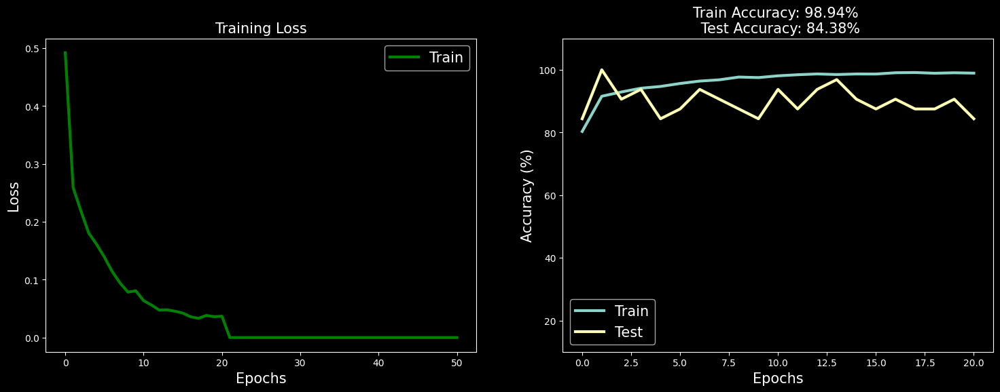

In [251]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(18, 6))

ax[0].plot(losses, 'g', lw=3, label='Train')
ax[0].set_xlabel('Epochs', fontsize=15)
ax[0].set_ylabel('Loss', fontsize=15)
ax[0].legend(fontsize=15)
ax[0].set_title('Training Loss', fontsize=15)

ax[1].plot(trainAcc, label='Train', lw=3)
ax[1].plot(testAcc, label='Test', lw=3)
ax[1].set_xlabel('Epochs', fontsize=15)
ax[1].set_ylabel('Accuracy (%)', fontsize=15)
ax[1].set_ylim([10, 110])
ax[1].set_title(f'Train Accuracy: {trainAcc[-1]:.2f}% \n Test Accuracy: {testAcc[-1]:.2f}%', fontsize=15)
ax[1].legend(fontsize=15)

plt.show()

#### Accuracy on Validation Dataset

In [252]:
#Testing Accuracy on Validation Dataset.

correct = 0
total = 0
with torch.no_grad():
    for data in val_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = alexnet_model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the Validation images: %.2f %%' % (100 * correct / total))

Accuracy of the network on the Validation images: 89.01 %


#### Predict and calculate the Accuracy of each class in the Validation Dataset

In [253]:
# Determine the number of classes dynamically on Validation Dataset and get Accuracy of each class

num_classes = len(class_names)

class_correct = list(0. for _ in range(num_classes))
class_total = list(0. for _ in range(num_classes))

# Rest of your code remains the same
with torch.no_grad():
    for data in val_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = alexnet_model(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(len(labels)):
            label = labels[i].item()
            class_correct[label] += c[i].item()
            class_total[label] += 1

# Print accuracy for each class
for i in range(num_classes):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))


Accuracy of buildings : 83 %
Accuracy of forest : 96 %
Accuracy of glacier : 77 %
Accuracy of mountain : 91 %
Accuracy of   sea : 88 %
Accuracy of street : 96 %


#### Accuracy on Testing Dataset

In [254]:
#Testing Accuracy on Testing Dataset

correct = 0
total = 0
with torch.no_grad():
    for data in test_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = alexnet_model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %.2f %%' % (100 * correct / total))

Accuracy of the network on the test images: 88.10 %


#### Predict and calculate the Accuracy of each class in the Testing Dataset

In [255]:
# Determine the number of classes dynamically
num_classes = len(class_names)

class_correct = list(0. for _ in range(num_classes))
class_total = list(0. for _ in range(num_classes))

# Rest of your code remains the same
with torch.no_grad():
    for data in test_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = alexnet_model(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(len(labels)):
            label = labels[i].item()
            class_correct[label] += c[i].item()
            class_total[label] += 1

# Print accuracy for each class
for i in range(num_classes):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))


Accuracy of buildings : 78 %
Accuracy of forest : 97 %
Accuracy of glacier : 79 %
Accuracy of mountain : 91 %
Accuracy of   sea : 85 %
Accuracy of street : 97 %


In [256]:
# Save the trained AlexNet model
torch.save(alexnet_model.state_dict(), 'alexnet_model.pth')

## VGG 16 MODEL

In [205]:
vgg = torchvision.models.vgg16('VGG16_Weights.DEFAULT')

c:\Users\bhave\anaconda3\envs\pytorch_env\Lib\site-packages\torchvision\models\_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\bhave/.cache\torch\hub\checkpoints\vgg16-397923af.pth
100.0%


In [207]:
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [206]:
# Freeze all layers
for p in vgg.parameters():
    p.requires_grad = False


In [209]:
vgg.classifier[6] = nn.Sequential(
                nn.Linear(in_features=4096, out_features=2048, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=2048, out_features=1024, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=1024, out_features=512, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=512, out_features=256, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=256, out_features=128, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=128, out_features=64, bias=True),
                nn.ReLU(),
                nn.Linear(in_features=64, out_features=6, bias=True))



In [210]:
vgg.to(device)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [214]:
lossfunc = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam([
          {"params": vgg.avgpool.parameters(), "lr": 0.0001},
          {"params": vgg.classifier[0].parameters(), "lr": 0.0001},
          {"params": vgg.classifier[3].parameters(), "lr": 0.001},
          {"params": vgg.classifier[6].parameters(), "lr": 0.001},
        ],
lr=0.001, betas=(0.9, 0.999), weight_decay = 0.004)

In [215]:
import time

# epochs
epochs = 51

# Instantiating the early stopping
earlystopping = EarlyStoppingCriterion()

In [216]:
# Initialize losses and Accuracies

losses    = torch.zeros(epochs)
trainAcc  = []
testAcc   = []

# loop over epochs
for epoch in range(epochs):
    start_time = time.time()
    vgg.train()

    # loop over training data batches
    batchAcc  = []
    batchLoss = []
    for X,y in train_loader:

        X = X.to(device) # Placing features on device
        y = y.to(device) # placing labels on device

        ypred = vgg(X)
        loss = lossfunc(ypred,y)


        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Append batchloss
        batchLoss.append(loss.item())

        ypred = ypred.cpu() # Back to cpu
        y = y.cpu()

        # Compute batch accuracy
        acc = 100 * torch.mean((torch.argmax(ypred, dim=1) == y).float())
        batchAcc.append(acc)

    # Batch loop concluded

    # Average training accuracy (Outside the batchloop)

    trainAcc.append(np.mean(batchAcc))

    # Losses through epochs

    losses[epoch] = np.mean(batchLoss)

    # TESTING the model

    vgg.eval()

    X,y = next(iter(val_loader))
    X = X.to(device)
    y = y.to(device)

    with torch.no_grad(): #This step  Deactivating autogradient
        ypred = vgg(X)
        ypred = ypred.cpu()
        y = y.cpu()

        # Appending test accuracy

        testAcc.append(100 * torch.mean((torch.argmax(ypred,dim=1)==y).float()))


    epoch_len = len(str(epochs))

    print_msg = (f'[{epoch+1:>{epoch_len}}/{epochs:>{epoch_len}}] ' +
             f'Train Loss: {np.mean(batchLoss):.5f}, Train Accuracy: {trainAcc[-1]:.2f}%, Overall Test Accuracy: {testAcc[-1]:.2f}%')

    print(print_msg)

    earlystopping(np.mean(batchLoss), vgg)

    # Optionally break the loop if early stopping criteria met
    if earlystopping.early_stop:
        print("Early stopping")
        break

    end_time = time.time()
    time_taken = end_time - start_time
    print(f'Time taken for Epoch {epoch+1}: {time_taken:.2f} seconds\n')

[ 1/51] Train Loss: 0.54174, Train Accuracy: 78.84%, Overall Test Accuracy: 90.62%
Time taken for Epoch 1: 100.73 seconds

[ 2/51] Train Loss: 0.37377, Train Accuracy: 86.85%, Overall Test Accuracy: 93.75%
Time taken for Epoch 2: 95.18 seconds

[ 3/51] Train Loss: 0.33458, Train Accuracy: 88.25%, Overall Test Accuracy: 93.75%
Time taken for Epoch 3: 94.94 seconds

[ 4/51] Train Loss: 0.31867, Train Accuracy: 88.79%, Overall Test Accuracy: 96.88%
Time taken for Epoch 4: 95.74 seconds

[ 5/51] Train Loss: 0.31314, Train Accuracy: 88.59%, Overall Test Accuracy: 87.50%
Time taken for Epoch 5: 92.87 seconds

[ 6/51] Train Loss: 0.29745, Train Accuracy: 89.38%, Overall Test Accuracy: 93.75%
Time taken for Epoch 6: 93.79 seconds

[ 7/51] Train Loss: 0.28322, Train Accuracy: 89.95%, Overall Test Accuracy: 90.62%
Time taken for Epoch 7: 91.52 seconds

[ 8/51] Train Loss: 0.28570, Train Accuracy: 89.78%, Overall Test Accuracy: 93.75%
EarlyStopping counter: 1 out of 3
Time taken for Epoch 8: 91.1

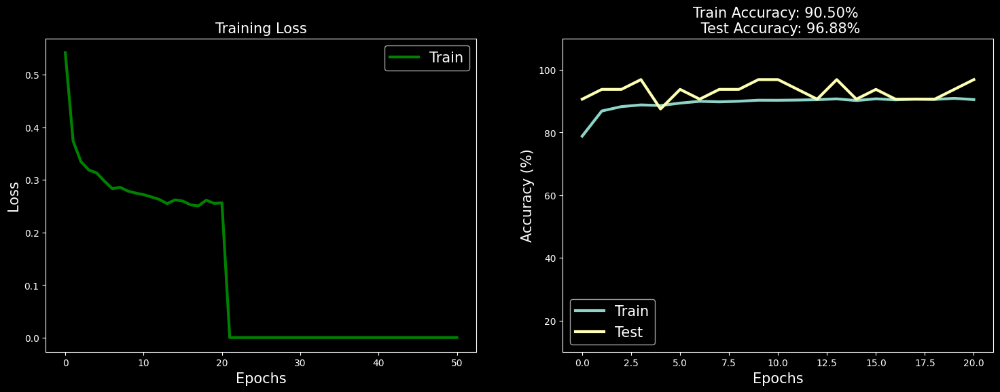

In [217]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(18, 6))

ax[0].plot(losses, 'g', lw=3, label='Train')
ax[0].set_xlabel('Epochs', fontsize=15)
ax[0].set_ylabel('Loss', fontsize=15)
ax[0].legend(fontsize=15)
ax[0].set_title('Training Loss', fontsize=15)

ax[1].plot(trainAcc, label='Train', lw=3)
ax[1].plot(testAcc, label='Test', lw=3)
ax[1].set_xlabel('Epochs', fontsize=15)
ax[1].set_ylabel('Accuracy (%)', fontsize=15)
ax[1].set_ylim([10, 110])
ax[1].set_title(f'Train Accuracy: {trainAcc[-1]:.2f}% \n Test Accuracy: {testAcc[-1]:.2f}%', fontsize=15)
ax[1].legend(fontsize=15)

plt.show()

#### Accuracy on Validation Dataset

In [218]:
#Testing Accuracy on Valication Dataset.

correct = 0
total = 0
with torch.no_grad():
    for data in val_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = vgg(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the val images: %.2f %%' % (100 * correct / total))

Accuracy of the network on the val images: 92.17 %


#### Predict and calculate the Accuracy of each class in the Validation Dataset

In [219]:
# Determine the number of classes dynamically on Validation Dataset
num_classes = len(class_names)

class_correct = list(0. for _ in range(num_classes))
class_total = list(0. for _ in range(num_classes))

# Rest of your code remains the same
with torch.no_grad():
    for data in val_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = vgg(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(len(labels)):
            label = labels[i].item()
            class_correct[label] += c[i].item()
            class_total[label] += 1

# Print accuracy for each class
for i in range(num_classes):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))


Accuracy of buildings : 90 %
Accuracy of forest : 99 %
Accuracy of glacier : 88 %
Accuracy of mountain : 85 %
Accuracy of   sea : 94 %
Accuracy of street : 96 %


#### Accuracy on Testing Dataset

In [220]:
#Testing Accuracy on Testing Dataset

correct = 0
total = 0
with torch.no_grad():
    for data in test_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = vgg(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the test images: %.2f %%' % (100 * correct / total))

Accuracy of the network on the test images: 91.60 %


#### Predict and calculate the Accuracy of each class in the Testing Dataset

In [221]:
# Determine the number of classes dynamically on Testing dataset and get accuracy of each class
num_classes = len(class_names)

class_correct = list(0. for _ in range(num_classes))
class_total = list(0. for _ in range(num_classes))

# Rest of your code remains the same
with torch.no_grad():
    for data in test_loader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = vgg(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(len(labels)):
            label = labels[i].item()
            class_correct[label] += c[i].item()
            class_total[label] += 1

# Print accuracy for each class
for i in range(num_classes):
    print('Accuracy of %5s : %2d %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))


Accuracy of buildings : 86 %
Accuracy of forest : 99 %
Accuracy of glacier : 86 %
Accuracy of mountain : 84 %
Accuracy of   sea : 97 %
Accuracy of street : 96 %


In [223]:
# Save the trained VGG16 model
torch.save(vgg.state_dict(), 'vgg16_model.pth')

### NOW WE WOULD TEST EACH MODEL ON UNSEEN DATASET THAT IS PRESENT IN 'seg_pred' FOLDER and VISUALIZE ITS OUTPUT

In [224]:
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os

class CustomPredictionDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.folder_path, self.image_files[idx])
        img = Image.open(img_path).convert("RGB")

        if self.transform:
            img = self.transform(img)

        return img, os.path.basename(img_path)


In [225]:
transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

pred_dataset = CustomPredictionDataset('./archive/seg_pred/seg_pred', transform=transform_test)
pred_loader = DataLoader(pred_dataset, batch_size=32, shuffle=False)


In [232]:
pred_loader

### Check Predection on the unseen Images using Resnet50 Model

In [238]:
predictions = []

with torch.no_grad():
    for data in pred_loader:
        images, filenames = data[0].to(device), data[1]
        outputs = resnet(images)
        _, predicted = torch.max(outputs, 1)
        predictions.extend(predicted.cpu().numpy())


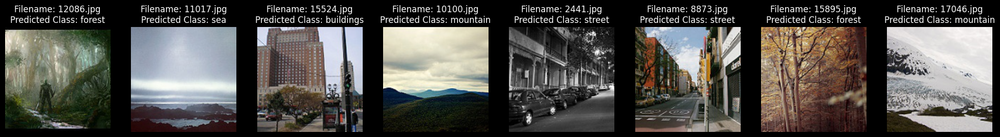

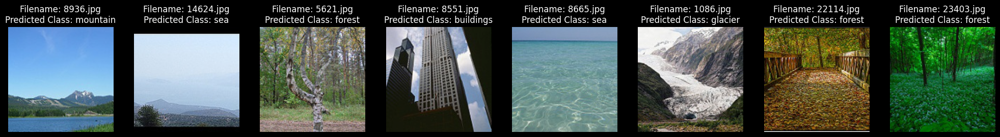

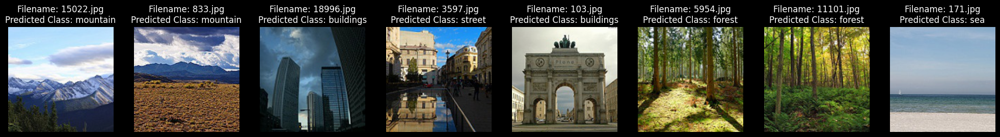

In [259]:
import matplotlib.pyplot as plt
import numpy as np

# Reverse normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Visualize 3 sets of 5 samples each
num_sets = 3
num_samples_per_set = 8

for set_idx in range(num_sets):
    # Select 5 random samples for each set
    indices_to_visualize = np.random.choice(len(predictions), num_samples_per_set, replace=False)

    # Create a horizontal row of subplots
    fig, axes = plt.subplots(1, num_samples_per_set, figsize=(25, 6))

    for idx, ax in zip(indices_to_visualize, axes):
        image, filename = pred_dataset[idx]
        predicted_class_name = class_names[predictions[idx]]

        # Convert PyTorch tensor to NumPy array and permute dimensions for RGB format
        image_np = np.array(image.permute(1, 2, 0))

        # Reverse normalization
        image_np = std * image_np + mean
        image_np = np.clip(image_np, 0, 1)  # Clip values to be in the valid range [0, 1]

        ax.imshow(image_np)
        ax.set_title(f'Filename: {filename}\nPredicted Class: {predicted_class_name}')
        ax.axis('off')  # Turn off axis labels for cleaner visualization

    plt.show()


### Check Predection on the unseen Images using AlexNet Model

In [240]:
predictions = []

with torch.no_grad():
    for data in pred_loader:
        images, filenames = data[0].to(device), data[1]
        outputs = alexnet_model(images)
        _, predicted = torch.max(outputs, 1)
        predictions.extend(predicted.cpu().numpy())


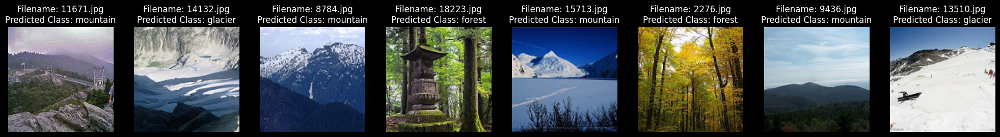

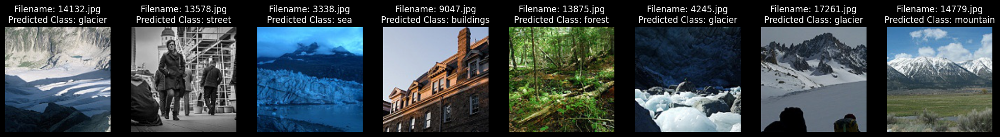

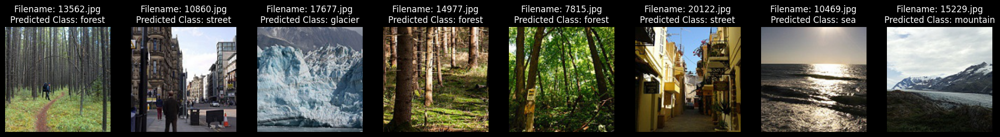

In [260]:
import matplotlib.pyplot as plt
import numpy as np

# Reverse normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Visualize 3 sets of 5 samples each
num_sets = 3
num_samples_per_set = 8

for set_idx in range(num_sets):
    # Select 5 random samples for each set
    indices_to_visualize = np.random.choice(len(predictions), num_samples_per_set, replace=False)

    # Create a horizontal row of subplots
    fig, axes = plt.subplots(1, num_samples_per_set, figsize=(25, 6))

    for idx, ax in zip(indices_to_visualize, axes):
        image, filename = pred_dataset[idx]
        predicted_class_name = class_names[predictions[idx]]

        # Convert PyTorch tensor to NumPy array and permute dimensions for RGB format
        image_np = np.array(image.permute(1, 2, 0))

        # Reverse normalization
        image_np = std * image_np + mean
        image_np = np.clip(image_np, 0, 1)  # Clip values to be in the valid range [0, 1]

        ax.imshow(image_np)
        ax.set_title(f'Filename: {filename}\nPredicted Class: {predicted_class_name}')
        ax.axis('off')  # Turn off axis labels for cleaner visualization

    plt.show()


### Check Predection on the unseen Images using VGG16 Model

In [233]:
predictions = []

with torch.no_grad():
    for data in pred_loader:
        images, filenames = data[0].to(device), data[1]
        outputs = vgg(images)
        _, predicted = torch.max(outputs, 1)
        predictions.extend(predicted.cpu().numpy())


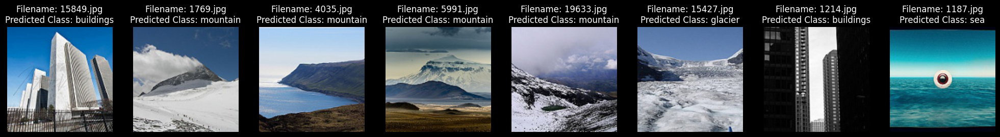

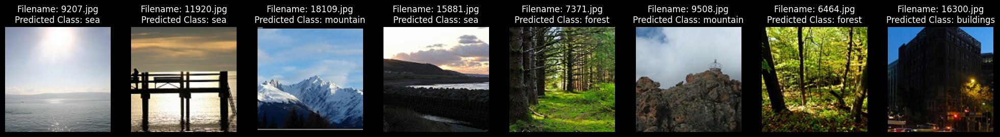

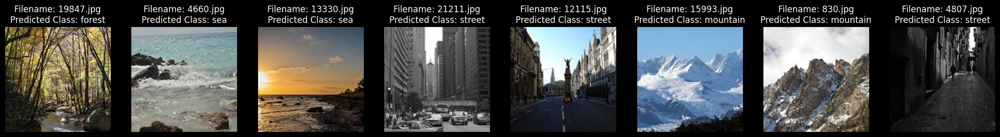

In [261]:
import matplotlib.pyplot as plt
import numpy as np

# Reverse normalization
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Visualize 3 sets of 5 samples each
num_sets = 3
num_samples_per_set = 8

for set_idx in range(num_sets):
    # Select 5 random samples for each set
    indices_to_visualize = np.random.choice(len(predictions), num_samples_per_set, replace=False)

    # Create a horizontal row of subplots
    fig, axes = plt.subplots(1, num_samples_per_set, figsize=(25, 6))

    for idx, ax in zip(indices_to_visualize, axes):
        image, filename = pred_dataset[idx]
        predicted_class_name = class_names[predictions[idx]]

        # Convert PyTorch tensor to NumPy array and permute dimensions for RGB format
        image_np = np.array(image.permute(1, 2, 0))

        # Reverse normalization
        image_np = std * image_np + mean
        image_np = np.clip(image_np, 0, 1)  # Clip values to be in the valid range [0, 1]

        ax.imshow(image_np)
        ax.set_title(f'Filename: {filename}\nPredicted Class: {predicted_class_name}')
        ax.axis('off')  # Turn off axis labels for cleaner visualization

    plt.show()
